### Hackathon Project

### Group 1
1) Ajayi John Abiola                       
2) Ojeleye Solomon Olamide                 
3) Akinola Mercy Jesudunsin                
4) Akaninyene Happiness
5) Ajayi Micheal
6) Babayeju Adedeji Emmanuel
7) Toyese.A.Atilade

### Table of Content
1) Project Overview 
2) Problem Statement                                   
3) Our aim              
4) Import Libraries and modules                       
5) Data Wrangling on Dataset
6) Visualization, Findings and Recommendation
7) Conclusion 
                                      
                                            
                                                 
                        
                                  
 
 
   



### Project Overview

#### The primary objective of this project is to analyse a dataset related to loans in order to extract actionable insights, identify patterns, and make data-driven processes, risk management, and overall financial decision making. 

### Problem Statement
Predicting the likelihood of loan default based on borrower's income, loan intent and Education.

### Our Aim
1) To know the relatioship the between borrower income, education and loan intent on default with visuals
2) computing a statistical test to know the significance difference using chi-square and T-test,

#### Import Libraries and modules

In [1]:
import pandas as pd
import numpy as np


import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm
from scipy.stats import f_oneway,pearsonr,chi2_contingency,spearmanr

from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler,LabelEncoder

#### Data Wrangling on Dataset

In [2]:
# importing of our dataset

loan_dataset = pd.read_csv('loan_data.csv')

In [3]:
loan_dataset.head()

,person_age,person_gender,person_education,person_income,person_emp_exp,person_home_ownership,loan_amnt,loan_intent,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,credit_score,previous_loan_defaults_on_file,loan_status
0,22.0,female,Master,71948.0,0,RENT,35000.0,PERSONAL,16.02,0.49,3.0,561,No,1
1,21.0,female,High School,12282.0,0,OWN,1000.0,EDUCATION,11.14,0.08,2.0,504,Yes,0
2,25.0,female,High School,12438.0,3,MORTGAGE,5500.0,MEDICAL,12.87,0.44,3.0,635,No,1
3,23.0,female,Bachelor,79753.0,0,RENT,35000.0,MEDICAL,15.23,0.44,2.0,675,No,1
4,24.0,male,Master,66135.0,1,RENT,35000.0,MEDICAL,14.27,0.53,4.0,586,No,1


In [4]:
# checking our dataset datatype

loan_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45000 entries, 0 to 44999
Data columns (total 14 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   person_age                      45000 non-null  float64
 1   person_gender                   45000 non-null  object 
 2   person_education                45000 non-null  object 
 3   person_income                   45000 non-null  float64
 4   person_emp_exp                  45000 non-null  int64  
 5   person_home_ownership           45000 non-null  object 
 6   loan_amnt                       45000 non-null  float64
 7   loan_intent                     45000 non-null  object 
 8   loan_int_rate                   45000 non-null  float64
 9   loan_percent_income             45000 non-null  float64
 10  cb_person_cred_hist_length      45000 non-null  float64
 11  credit_score                    45000 non-null  int64  
 12  previous_loan_defaults_on_file  

In [5]:
loan_dataset.isnull().sum()

person_age                        0
person_gender                     0
person_education                  0
person_income                     0
person_emp_exp                    0
person_home_ownership             0
loan_amnt                         0
loan_intent                       0
loan_int_rate                     0
loan_percent_income               0
cb_person_cred_hist_length        0
credit_score                      0
previous_loan_defaults_on_file    0
loan_status                       0
dtype: int64

In [6]:
# dropping of redundant colum 

loan_dataset.drop(columns = ['loan_status'], inplace = True)

In [7]:

loan_dataset['person_age'] = loan_dataset['person_age'].astype(int)

In [8]:
loan_dataset.iloc[0:10]

,person_age,person_gender,person_education,person_income,person_emp_exp,person_home_ownership,loan_amnt,loan_intent,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,credit_score,previous_loan_defaults_on_file
0,22,female,Master,71948.0,0,RENT,35000.0,PERSONAL,16.02,0.49,3.0,561,No
1,21,female,High School,12282.0,0,OWN,1000.0,EDUCATION,11.14,0.08,2.0,504,Yes
2,25,female,High School,12438.0,3,MORTGAGE,5500.0,MEDICAL,12.87,0.44,3.0,635,No
3,23,female,Bachelor,79753.0,0,RENT,35000.0,MEDICAL,15.23,0.44,2.0,675,No
4,24,male,Master,66135.0,1,RENT,35000.0,MEDICAL,14.27,0.53,4.0,586,No
5,21,female,High School,12951.0,0,OWN,2500.0,VENTURE,7.14,0.19,2.0,532,No
6,26,female,Bachelor,93471.0,1,RENT,35000.0,EDUCATION,12.42,0.37,3.0,701,No
7,24,female,High School,95550.0,5,RENT,35000.0,MEDICAL,11.11,0.37,4.0,585,No
8,24,female,Associate,100684.0,3,RENT,35000.0,PERSONAL,8.90,0.35,2.0,544,No
9,21,female,High School,12739.0,0,OWN,1600.0,VENTURE,14.74,0.13,3.0,640,No


In [9]:
# to check the categories in person_education

loan_dataset['person_education'].unique()

array(['Master', 'High School', 'Bachelor', 'Associate', 'Doctorate'],
      dtype=object)

In [10]:
loan_dataset.shape

(45000, 13)

### VISUALISATION

In [11]:
# steps in hypothesis testing

# set up the hypothesis
ho = 'There is no significant difference between Person_education and previous_loan_defaults_on_file '
h1 = 'There is a significant difference between person_education and previous_loan_defaults_on_file'

# choose level of significance
alpha = 0.05

# setup the decision rule
def decision(p_value:float):

  if p_value < alpha:
    result = h1
  else:
    result = ho
  return f'{result} @ pvalue: {round(p_value, 4)}'

cross_tab = pd.crosstab(loan_dataset['person_education'],loan_dataset['previous_loan_defaults_on_file'])
chi_stats, chi_pvalue, dof, exp = chi2_contingency(cross_tab)

decision(chi_pvalue)

'There is a significant difference between person_education and previous_loan_defaults_on_file @ pvalue: 0.0'

<Axes: xlabel='person_education', ylabel='count'>

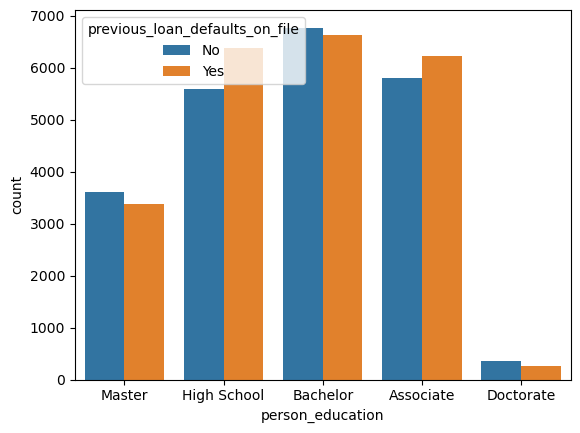

In [12]:

sns.countplot(data=loan_dataset, x ='person_education',hue = 'previous_loan_defaults_on_file',)



#### Observation
###### Persons in Masters, Bachelor and Doctorate categories have higher chances of returing their loan while persons in High School and Associate have a slim chances of returning loan. Its highly recomended that we give more loan to persons in Masters, Bachelor and Doctorate.

In [13]:
# steps in hypothesis testing

# set up the hypothesis
ho = 'There is no significant difference between loan_intent and previous_loan_defaults_on_file '
h1 = 'There is a significant difference between loan_intent and previous_loan_defaults_on_file'

# choose level of significance
alpha = 0.05

# setup the decision rule
def decision(p_value:float):

  if p_value < alpha:
    result = h1
  else:
    result = ho
  return f'{result} @ pvalue: {round(p_value, 4)}'

cross_tab = pd.crosstab(loan_dataset['loan_intent'],loan_dataset['previous_loan_defaults_on_file'])
chi_stats, chi_pvalue, dof, exp = chi2_contingency(cross_tab)

decision(chi_pvalue)

'There is a significant difference between loan_intent and previous_loan_defaults_on_file @ pvalue: 0.0'

<Axes: xlabel='count', ylabel='loan_intent'>

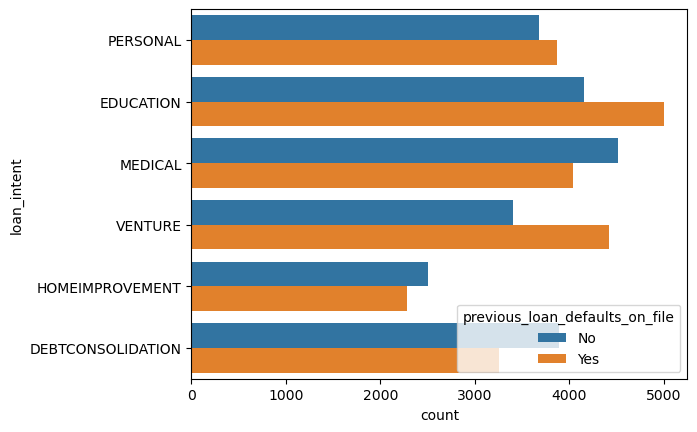

In [14]:
sns.countplot(data=loan_dataset, y ='loan_intent',hue = 'previous_loan_defaults_on_file',)


#### Observation
###### Persons with loan intent such as Medical, Homeimprovement and Debtconsolidation have higher chance of returning their loan while persons with loan intent such as Personal, Education and venture have a slim change of returning loan. Its safe to give more loan to Medical, Homeimprovement and Debtconsolidation Category. 

In [16]:
# steps in hypothesis testing

# set up the hypothesis
ho = 'There is no significant difference between person income across previous_loan_defaults_on_file '
h1 = 'There is a significant difference between person income across previous_loan_defaults_on_file '

# choose level of significance
alpha = 0.05

# setup the decision rule
def decision(p_value:float):

  if p_value < alpha:
    result = h1
  else:
    result = ho
  return f'{result} @ pvalue: {round(p_value, 4)}'

from scipy.stats import ttest_ind

yes_income = loan_dataset[loan_dataset['previous_loan_defaults_on_file'] == 'Yes']['person_income'].values
no_income = loan_dataset[loan_dataset['previous_loan_defaults_on_file'] == 'No']['person_income'].values

stats, previous_loan_defaults_on_file_pvalue = ttest_ind(yes_income, no_income)


# get conclusion
decision(p_value= previous_loan_defaults_on_file_pvalue)

'There is a significant difference between person income across previous_loan_defaults_on_file  @ pvalue: 0.0'

In [ ]:
anova_table

In [ ]:
sns.barplot(data=loan_dataset,x='previous_loan_defaults_on_file', y ='person_income',)

#### Observation
###### It is obvious that getting a higher income does not neccesarily mean that clients wont default on loan. Here clients with lower income have higher chance of returning loan. Its safe to give client with lower income more loan. 

In [19]:
# encode our data
final_data = loan_dataset.copy()

encoder = LabelEncoder()

cols = ['person_education', 'person_gender','person_home_ownership','loan_intent',
       'previous_loan_defaults_on_file']
for col in cols:
  loan_dataset[col] = encoder.fit_transform(loan_dataset[col])

In [20]:
loan_dataset.head()

,person_age,person_gender,person_education,person_income,person_emp_exp,person_home_ownership,loan_amnt,loan_intent,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,credit_score,previous_loan_defaults_on_file
0,22,0,4,71948.0,0,3,35000.0,4,16.02,0.49,3.0,561,0
1,21,0,3,12282.0,0,2,1000.0,1,11.14,0.08,2.0,504,1
2,25,0,3,12438.0,3,0,5500.0,3,12.87,0.44,3.0,635,0
3,23,0,1,79753.0,0,3,35000.0,3,15.23,0.44,2.0,675,0
4,24,1,4,66135.0,1,3,35000.0,3,14.27,0.53,4.0,586,0


## Clustering

In [21]:
scaler = StandardScaler()
columns = loan_dataset.columns
loan_dataset = scaler.fit_transform(loan_dataset)
loan_dataset = pd.DataFrame(data = loan_dataset, columns = columns)

In [22]:
loan_dataset.head()

,person_age,person_gender,person_education,person_income,person_emp_exp,person_home_ownership,loan_amnt,loan_intent,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,credit_score,previous_loan_defaults_on_file
0,-0.953538,-1.110069,1.525264,-0.104090,-0.892284,0.904822,4.024953,0.852919,1.683039,4.016394,-0.739109,-1.419814,-1.016040
1,-1.118963,-1.110069,0.849192,-0.846005,-0.892284,0.210609,-1.359209,-0.882904,0.044782,-0.684829,-0.996863,-2.549975,0.984213
2,-0.457264,-1.110069,0.849192,-0.844065,-0.397517,-1.177817,-0.646600,0.274312,0.625557,3.443074,-0.739109,0.047412,-1.016040
3,-0.788113,-1.110069,-0.502953,-0.007039,-0.892284,0.904822,4.024953,0.274312,1.417829,3.443074,-0.996863,0.840507,-1.016040
4,-0.622689,0.900845,1.525264,-0.176371,-0.727362,0.904822,4.024953,0.274312,1.095549,4.475050,-0.481354,-0.924130,-1.016040


In [23]:
pca = PCA(n_components = 3)
columns = ['column1','column2','column3']
loan_dataset = pca.fit_transform(loan_dataset)
loan_dataset = pd.DataFrame(data = loan_dataset, columns = columns)


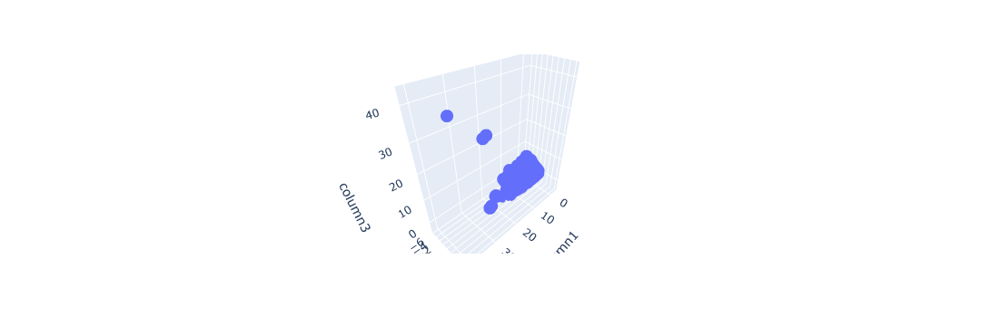

In [24]:
px.scatter_3d(data_frame = loan_dataset, x = 'column1', y = 'column2', z = 'column3')

In [26]:
kmeans = KMeans(n_clusters = 4, n_init = 'auto', random_state = 23)
predictions = kmeans.fit_predict(loan_dataset)
final_data['predictions'] = [f'clusters_{x}' for x in predictions]

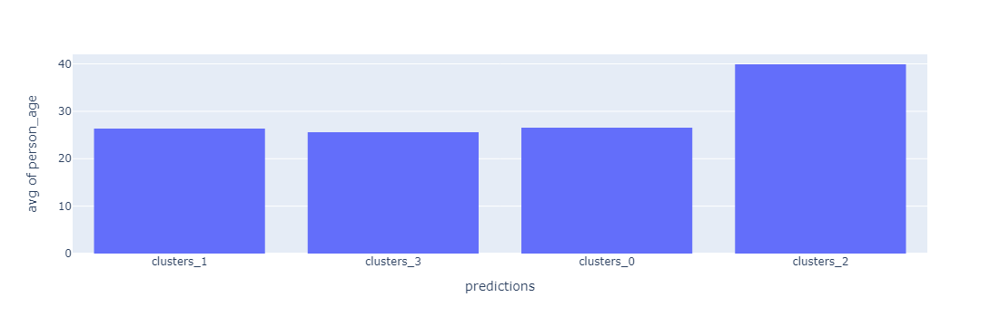

In [27]:
#sns.countplot(data = final_data, x = 'predictions', hue = 'previous_loan_defaults_on_file')
px.histogram(data_frame = final_data, x = 'predictions', y = 'person_age', histfunc = 'avg')

In [28]:
final_data[final_data['predictions'] == 'clusters_0']

,person_age,person_gender,person_education,person_income,person_emp_exp,person_home_ownership,loan_amnt,loan_intent,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,credit_score,previous_loan_defaults_on_file,predictions
15,23,female,Master,600891.0,5,MORTGAGE,30000.0,DEBTCONSOLIDATION,10.65,0.05,3.0,670,Yes,clusters_0
33,25,female,High School,368115.0,3,RENT,24250.0,DEBTCONSOLIDATION,13.85,0.07,3.0,567,Yes,clusters_0
34,26,female,Associate,361076.0,1,MORTGAGE,7800.0,MEDICAL,13.49,0.02,4.0,669,No,clusters_0
42,26,male,Bachelor,361293.0,5,MORTGAGE,20000.0,VENTURE,7.88,0.06,4.0,684,Yes,clusters_0
44,26,male,Master,360680.0,5,OWN,10000.0,HOMEIMPROVEMENT,10.38,0.03,4.0,649,No,clusters_0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44836,26,male,Doctorate,293525.0,5,MORTGAGE,11635.0,DEBTCONSOLIDATION,15.81,0.04,4.0,689,No,clusters_0
44871,28,female,High School,72179.0,6,MORTGAGE,7879.0,DEBTCONSOLIDATION,11.00,0.11,10.0,573,No,clusters_0
44878,29,male,Bachelor,97118.0,3,MORTGAGE,10000.0,PERSONAL,11.89,0.10,5.0,664,No,clusters_0
44922,29,male,Master,726416.0,7,MORTGAGE,24890.0,MEDICAL,9.07,0.03,9.0,634,No,clusters_0


<Axes: xlabel='predictions', ylabel='count'>

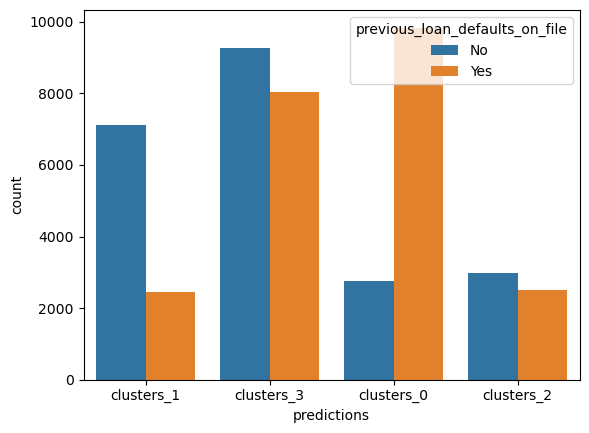

In [29]:
sns.countplot(data = final_data, x = 'predictions', hue = 'previous_loan_defaults_on_file')

#### Findings
 Based on the cluster analysis above, it is evident that there is a combination of behavioural characterictis 
 that contributes to whether a customer is going to payback or default on a loan.
 from the chart we saw that : 
 * people in cluster 0 are usually defaulters meaning anyone that exhibits the same character traits will likely default.
 *  people in cluster 1 are usually not defaulters meaning that anyonw that exhibits the same character traits will likely not default.


Moving on, we will attempts to uncover the variables that consistutes the behavioural traits


<Axes: xlabel='predictions', ylabel='count'>

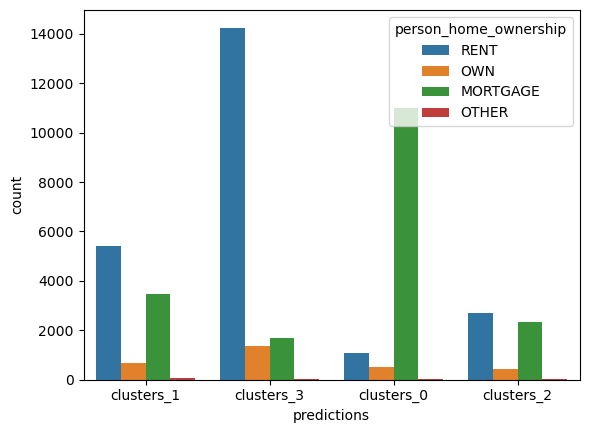

In [30]:
sns.countplot(data = final_data, x = 'predictions', hue = 'person_home_ownership')

In this variable, we discover that people that has mortgage in clusters 0 tends not to payback loan 


as well as people that rent in cluster 3 will not payback loan 


<Axes: xlabel='predictions', ylabel='count'>

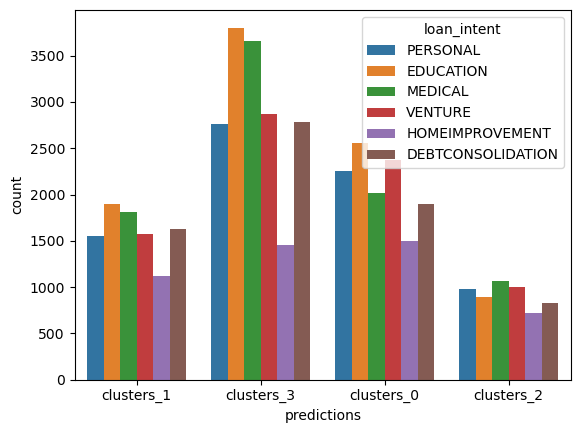

In [31]:
sns.countplot(data = final_data, x = 'predictions', hue = 'loan_intent')

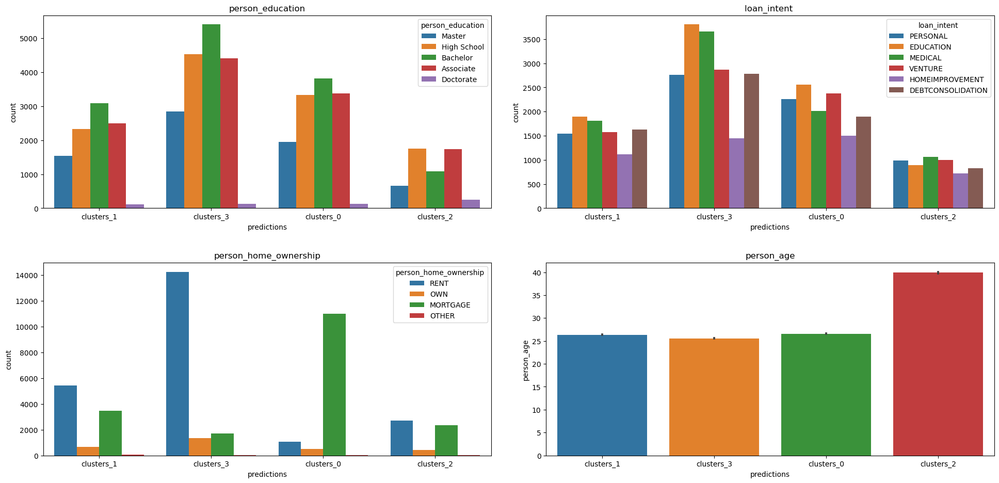

In [32]:
fig, axes = plt.subplots(nrows = 2, ncols = 2, figsize = (20, 10))
sns.countplot(data = final_data, x = 'predictions',hue = 'person_education', ax=axes[0,0])
sns.countplot(data = final_data, x = 'predictions',hue ='loan_intent', ax=axes[0,1])
sns.countplot(data = final_data, x = 'predictions',hue = 'person_home_ownership', ax=axes[1,0])
sns.barplot(data = final_data, x = 'predictions',y ='person_age', ax=axes[1,1])

axes[0,0].set_title('person_education')
axes[0,1].set_title('loan_intent ')
axes[1,0].set_title('person_home_ownership')
axes[1,1].set_title('person_age')

fig.tight_layout(pad = 3)

#### Findings

Looking at this cluster subplot, we categorize them into clusters against different columns in our dataset which tends to analayse who will default loan based on previous file:
As regards  Person Home Ownership:.


*looking at persons that falls under clusters_0 :possibilities chances for person living in a mortgage home  defaulting is very high futhermore,


*If we look at cluster 3 as well possibilities for person that rent a house tends not to pay back loan as it is very high as well

In [37]:
final_data[final_data['predictions'] == 'clusters_1']

,person_age,person_gender,person_education,person_income,person_emp_exp,person_home_ownership,loan_amnt,loan_intent,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,credit_score,previous_loan_defaults_on_file,predictions
0,22,female,Master,71948.0,0,RENT,35000.0,PERSONAL,16.02,0.49,3.0,561,No,clusters_1
2,25,female,High School,12438.0,3,MORTGAGE,5500.0,MEDICAL,12.87,0.44,3.0,635,No,clusters_1
3,23,female,Bachelor,79753.0,0,RENT,35000.0,MEDICAL,15.23,0.44,2.0,675,No,clusters_1
4,24,male,Master,66135.0,1,RENT,35000.0,MEDICAL,14.27,0.53,4.0,586,No,clusters_1
6,26,female,Bachelor,93471.0,1,RENT,35000.0,EDUCATION,12.42,0.37,3.0,701,No,clusters_1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44990,31,male,Master,136832.0,9,RENT,12319.0,PERSONAL,16.92,0.09,7.0,722,No,clusters_1
44991,24,male,High School,37786.0,0,MORTGAGE,13500.0,EDUCATION,13.43,0.36,4.0,612,No,clusters_1
44994,24,female,Associate,31924.0,2,RENT,12229.0,MEDICAL,10.70,0.38,4.0,678,No,clusters_1
44995,27,male,Associate,47971.0,6,RENT,15000.0,MEDICAL,15.66,0.31,3.0,645,No,clusters_1


In [40]:
final_data[final_data


,person_age,person_gender,person_education,person_income,person_emp_exp,person_home_ownership,loan_amnt,loan_intent,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,credit_score,previous_loan_defaults_on_file,predictions
1,21,female,High School,12282.0,0,OWN,1000.0,EDUCATION,11.14,0.08,2.0,504,Yes,clusters_3
5,21,female,High School,12951.0,0,OWN,2500.0,VENTURE,7.14,0.19,2.0,532,No,clusters_3
9,21,female,High School,12739.0,0,OWN,1600.0,VENTURE,14.74,0.13,3.0,640,No,clusters_3
11,21,female,Associate,13113.0,0,OWN,4500.0,HOMEIMPROVEMENT,8.63,0.34,2.0,651,No,clusters_3
19,24,female,Master,14283.0,1,MORTGAGE,1750.0,EDUCATION,10.99,0.12,2.0,679,No,clusters_3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44989,24,male,Bachelor,16779.0,0,RENT,4000.0,PERSONAL,14.29,0.24,3.0,624,No,clusters_3
44992,23,female,Bachelor,40925.0,0,RENT,9000.0,PERSONAL,11.01,0.22,4.0,487,No,clusters_3
44993,27,female,High School,35512.0,4,RENT,5000.0,PERSONAL,15.83,0.14,5.0,505,No,clusters_3
44997,33,male,Associate,56942.0,7,RENT,2771.0,DEBTCONSOLIDATION,10.02,0.05,10.0,668,No,clusters_3
